# Кластеризация
__Суммарное количество баллов: 10__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[HSE][ML][HW02] <ФИО>`, где вместо `<ФИО>` указаны фамилия и имя__

В этом домашнем задании предлагается реализовать три различных метода кластеризации, понять, в каких случаях стоит применять те или иные методы, а так же применить один из алгоритмов к задаче уменьшения цветности изображения.

In [1]:
from sklearn.neighbors import KDTree
from sklearn.datasets import make_blobs, make_moons, make_swiss_roll
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib
import copy
import cv2
import sys
from collections import deque
from typing import NoReturn

In [2]:
def visualize_clasters(X, labels):
    unique_labels = np.unique(labels)
    unique_colors = np.random.random((len(unique_labels), 3))
    colors = [unique_colors[l] for l in labels]
    plt.figure(figsize=(9, 9))
    plt.scatter(X[:, 0], X[:, 1], c=colors)
    plt.show()

def clusters_statistics(flatten_image, cluster_colors, cluster_labels):
    fig, axes = plt.subplots(3, 2, figsize=(12, 16))
    for remove_color in range(3):
        axes_pair = axes[remove_color]
        first_color = 0 if remove_color != 0 else 2
        second_color = 1 if remove_color != 1 else 2
        axes_pair[0].scatter([p[first_color] for p in flatten_image], [p[second_color] for p in flatten_image], c=flatten_image, marker='.')
        axes_pair[1].scatter([p[first_color] for p in flatten_image], [p[second_color] for p in flatten_image], c=[cluster_colors[c] for c in cluster_labels], marker='.')
        for a in axes_pair:
            a.set_xlim(0, 1)
            a.set_ylim(0, 1)
    plt.show()

Генерируем два синтетических набора данных для кластеризации. Далее будем тестировать наши алгоритмы на них.

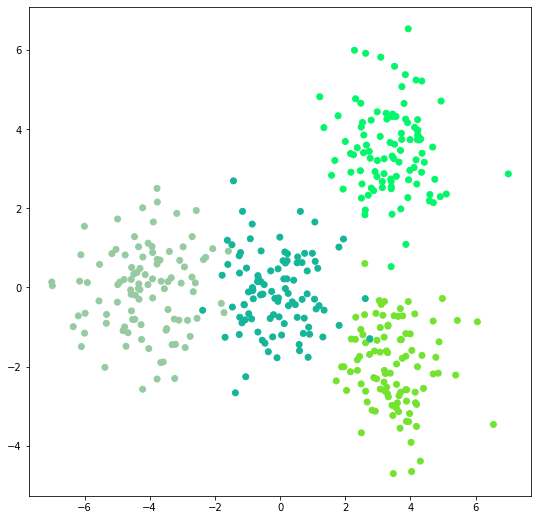

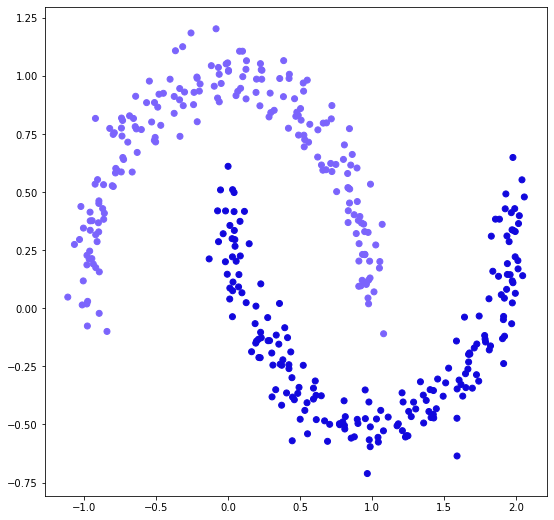

In [3]:
X_1, true_labels = make_blobs(400, 2, centers=[[0, 0], [-4, 0], [3.5, 3.5], [3.5, -2.0]])
visualize_clasters(X_1, true_labels)
X_2, true_labels = make_moons(400, noise=0.075)
visualize_clasters(X_2, true_labels)

### Задание 1 (3 балла)
Первый метод, который предлагается реализовать - метод K средних.

#### Описание методов
`fit(X, y=None)` ищет и запоминает в `self.centroids` центроиды кластеров для набора данных.
`predict(X)` для каждого элемента из `X` возвращает номер кластера, к которому относится данный элемент.

#### Инициализация кластеров
Есть несколько вариантов инициализации кластеров. Нужно реализовать их все:
1. `random` - центроиды кластеров являются случайными точками
2. `sample` - центроиды кластеров выбираются случайно из набора данных
3. `k-means++` - центроиды кластеров инициализируются при помощи метода K-means++

__Не забудте реинициализировать пустые кластеры!__

In [4]:
def distance(p1, p2):
    return np.sum((p1 - p2)**2)

def init_k_means_pp(X: np.array, k: int):
    centroids = list(init_sample(X, 1))
    for c_id in range(k - 1):
        dist = []
        for i in range(X.shape[0]):
            point = X[i, :]
            d = distance(point, centroids[0])
            for j in range(len(centroids)):
                d = min(d, distance(point, centroids[j]))
            dist.append(d)
        dist = np.array(dist)
        next_centroid = X[np.argmax(dist), :]
        centroids.append(next_centroid)
    return np.array(centroids)
    
    
def init_random(k: int, d: int):
    return np.random.rand(k,d)
    
    
def init_sample(X: np.array, k: int):
    a = np.zeros((X.shape[0],))
    a[0:k] = 1
    np.random.shuffle(a)
    return X[a==1]
    

class KMeans:
    def __init__(self, n_clusters: int, init: str = "k-means++", 
                 max_iter: int = 300):
        self.clusters = n_clusters
        self.init = init
        self.max_iter = max_iter
        """
        
        Parameters
        ----------
        n_clusters : int
            Число итоговых кластеров при кластеризации.
        init : str
            Способ инициализации кластеров. Один из трех вариантов:
            1. random --- центроиды кластеров являются случайными точками,
            2. sample --- центроиды кластеров выбираются случайно из  X,
            3. k-means++ --- центроиды кластеров инициализируются 
                при помощи метода K-means++.
        max_iter : int
            Максимальное число итераций для kmeans.
        
        """
        
    def fit(self, X: np.array, y = None) -> NoReturn:
        if self.init == 'random':
            print(X[0].shape)
            self.centroids = init_random(self.clusters, X[0].shape[0])
        if self.init == 'sample':
            self.centroids = init_sample(X, self.clusters)
        if self.init == 'k-means++':
            self.centroids = init_k_means_pp(X, self.clusters)
        """
        Ищет и запоминает в self.centroids центроиды кластеров для X.
        
        Parameters
        ----------
        X : np.array
            Набор данных, который необходимо кластеризовать.
        y : Ignored
            Не используемый параметр, аналогично sklearn
            (в sklearn считается, что все функции fit обязаны принимать 
            параметры X и y, даже если y не используется).
        
        """
    
    def predict(self, X: np.array) -> np.array:
        clusters_ind = []
        for i in range(self.max_iter):
            tree = KDTree(self.centroids, leaf_size=1)              
            clusters_ind = np.squeeze(tree.query(X, k=1, return_distance=False).T)
            new_centroids = np.array([X[clusters_ind == [i]].mean(axis=1) for i in range(self.clusters)], dtype=object)
            
            not_empty_clusters = np.unique(clusters_ind)
            if not_empty_clusters.shape[0] != self.clusters:
                for cluster_index in range(0, self.clusters):
                    if not (cluster_index in not_empty_clusters):
                        self.centroids[cluster_index] = np.rand(X[0].shape[0])
                        i = i-1
                        continue
                
            if np.array_equal(new_centroids,self.centroids):
                return clusters_ind
        return clusters_ind
        """
        Для каждого элемента из X возвращает номер кластера, 
        к которому относится данный элемент.
        
        Parameters
        ----------
        X : np.array
            Набор данных, для элементов которого находятся ближайшие кластера.
        
        Return
        ------
        labels : np.array
            Вектор индексов ближайших кластеров 
            (по одному индексу для каждого элемента из X).
        
        """
        

Протестируйте алгоритм на синтетических данных. При необходимости подберите гиперпараметры для достижения лучшего качества кластеризации.

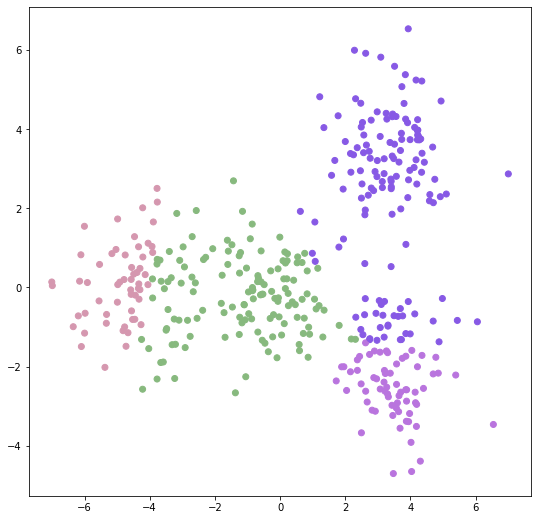

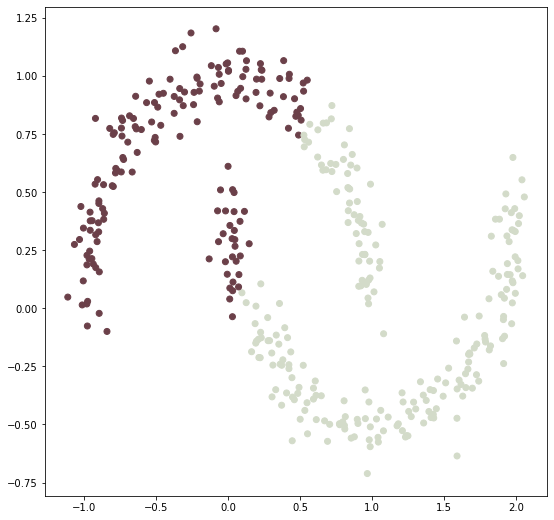

In [5]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(X_1)
labels = kmeans.predict(X_1)
visualize_clasters(X_1, labels)

kmeans = KMeans(n_clusters=2)
kmeans.fit(X_2)
labels = kmeans.predict(X_2)
visualize_clasters(X_2, labels)

### Задание 2 (2 балла)
В отличии от K-means, DBScan не позволяет задать количество кластеров, на которое будут разбиты данные. Руководствуясь геометрической интерпретацией, он позволяет выделять кластеры более сложной формы.

#### Описание методов
`fit_predict(X, y=None)` для каждого элемента `X` возвращает метку кластера, к которому он относится.

#### Возможные метрики
* `euclidean`
* `manhattan`
* `chebyshev`

__Для быстрого поиска соседей используйте `sklearn.neighbors.KDTree`__

In [6]:
class DBScan:
    def __init__(self, eps: float = 0.5, min_samples: int = 5, 
                 leaf_size: int = 40, metric: str = "euclidean"):
        """
        
        Parameters
        ----------
        eps : float, min_samples : int
            Параметры для определения core samples.
            Core samples --- элементы, у которых в eps-окрестности есть 
            хотя бы min_samples других точек.
        metric : str
            Метрика, используемая для вычисления расстояния между двумя точками.
            Один из трех вариантов:
            1. euclidean 
            2. manhattan
            3. chebyshev
        leaf_size : int
            Минимальный размер листа для KDTree.

        """
        raise NotImplementedError()
        
    def fit_predict(self, X: np.array, y = None) -> np.array:
        """
        Кластеризует элементы из X, 
        для каждого возвращает индекс соотв. кластера.
        Parameters
        ----------
        X : np.array
            Набор данных, который необходимо кластеризовать.
        y : Ignored
            Не используемый параметр, аналогично sklearn
            (в sklearn считается, что все функции fit_predict обязаны принимать 
            параметры X и y, даже если y не используется).
        Return
        ------
        labels : np.array
            Вектор индексов кластеров
            (Для каждой точки из X индекс соотв. кластера).

        """
        raise NotImplementedError()

Протестируйте алгоритм на синтетических данных. При необходимости подберите гиперпараметры для достижения лучшего качества кластеризации.

In [7]:
dbscan = DBScan()
labels = dbscan.fit_predict(X_1)
visualize_clasters(X_1, labels)

dbscan = DBScan()
labels = dbscan.fit_predict(X_2)
visualize_clasters(X_2, labels)

NotImplementedError: 

### Задание 3 (3 балла)
Идея AgglomerativeClustering заключается в том, чтобы итеративно объединять кластеры с наименьшим расстоянием между ними. Данный метод обладает высокой вычислительной сложностью, поэтому применим только для относительно небольших наборов данных.

#### Описание методов
`fit_predict(X, y=None)` для каждого элемента `X` возвращает метку кластера, к которому он относится.

#### Linkage-функции
__Linkage__ - это способ, которым будет рассчитываться расстояние между кластерами. Предлагается реализовать три варианта такой функции:
1. `average` - расстояние рассчитывается как среднее расстояние между всеми парами точек, где одна принадлежит первому кластеру, а другая - второму.
2. `single` - расстояние рассчитывается как минимальное из расстояний между всеми парами точек, где одна принадлежит первому кластеру, а другая - второму.
2. `complete` - расстояние рассчитывается как максимальное из расстояний между всеми парами точек, где одна принадлежит первому кластеру, а другая - второму.

In [8]:
class AgglomertiveClustering:
    def distance(self, p1, p2):
        return np.sum((p1 - p2)**2)

    def check_dist_between_clusters_precalc(self, X: np.array, a: int, b: int):
        points_a = X[self.clusters == a]
        points_b = X[self.clusters == b]
        if points_a.size == 0 or points_b.size == 0:
            return None
        dist = np.array([((points_b - a)**2).sum(axis=1) for a in points_a])
        if self.linkage == 'average':
            return dist.mean()
        if self.linkage == 'single':
            return dist.min()
        return dist.max()
    
    def check_dist_between_clusters(self, X: np.array, a: int, b: int):
        points_a_ind = np.where(self.clusters == a)[0]
        points_b_ind = np.where(self.clusters == b)[0]
        if points_a_ind.size == 0 or points_b_ind.size == 0:
            return None
        dist = self.dist[np.ix_(points_a_ind, points_b_ind)]
        if self.linkage == 'average':
            return dist.mean()
        if self.linkage == 'single':
            return dist.min()
        return dist.max()
        
    def __init__(self, n_clusters: int = 16, linkage: str = "single"):
        self.clusters_count = n_clusters
        self.linkage = linkage
        self.dist = np.zeros((1, 1))
        """
        
        Parameters
        ----------
        n_clusters : int
            Количество кластеров, которые необходимо найти (то есть, кластеры 
            итеративно объединяются, пока их не станет n_clusters)
        linkage : str
            Способ для расчета расстояния между кластерами. Один из 3 вариантов:
            1. average --- среднее расстояние между всеми парами точек, 
               где одна принадлежит первому кластеру, а другая - второму.
            2. single --- минимальное из расстояний между всеми парами точек, 
               где одна принадлежит первому кластеру, а другая - второму.
            3. complete --- максимальное из расстояний между всеми парами точек,
               где одна принадлежит первому кластеру, а другая - второму.
        """
    
    def fit_predict(self, X: np.array, y = None) -> np.array:
        self.clusters = np.arange(X.shape[0])
        self.clusters_map = set(range(X.shape[0]))
        self.dist = np.zeros((X.shape[0], X.shape[0]))
        for i in range(X.shape[0]):
                for j in range(i):
                    self.dist[i][j] = self.dist[j][i] = self.distance(X[i], X[j])
        amount_clusters = X.shape[0]
        while amount_clusters > self.clusters_count:
            min_dist = sys.maxsize
            for i in range(X.shape[0]):
                for j in range(i):
                    if not i in self.clusters_map:
                        continue
                    if not j in self.clusters_map:
                        continue
                    if self.dist[i,j] == None:
                        continue
                    dist_cluster = self.dist[i, j]
                    if dist_cluster < min_dist:
                        min_dist = dist_cluster
                        a = i
                        b = j
            self.clusters[self.clusters == a] = b
            self.clusters_map.remove(a)
            for i in range(X.shape[0]):
                if i == b:
                    continue
                if not i in self.clusters:
                    continue
                self.dist[b][i] = self.check_dist_between_clusters(X, b, i)
                self.dist[i][b] = self.dist[b][i]
            amount_clusters -= 1
        unique_clusters = np.unique(self.clusters)
        for i in range(self.clusters_count):
            self.clusters[self.clusters == unique_clusters[i]] = i
        return self.clusters
            
        """
        Кластеризует элементы из X, 
        для каждого возвращает индекс соотв. кластера.
        Parameters
        ----------
        X : np.array
            Набор данных, который необходимо кластеризовать.
        y : Ignored
            Не используемый параметр, аналогично sklearn
            (в sklearn считается, что все функции fit_predict обязаны принимать 
            параметры X и y, даже если y не используется).
        Return
        ------
        labels : np.array
            Вектор индексов кластеров
            (Для каждой точки из X индекс соотв. кластера).

        """


Протестируйте алгоритм на синтетических данных. При необходимости подберите гиперпараметры для достижения лучшего качества кластеризации.

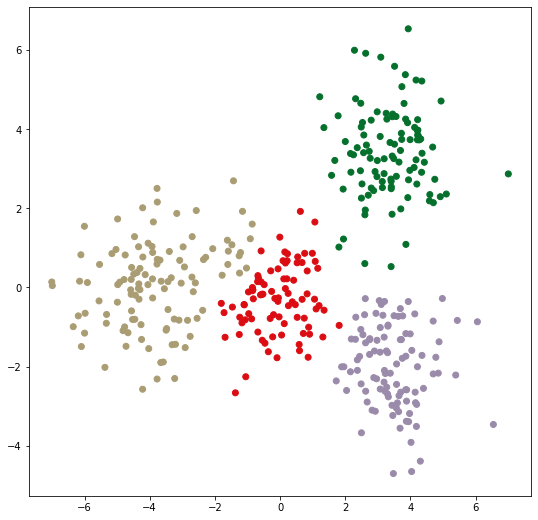

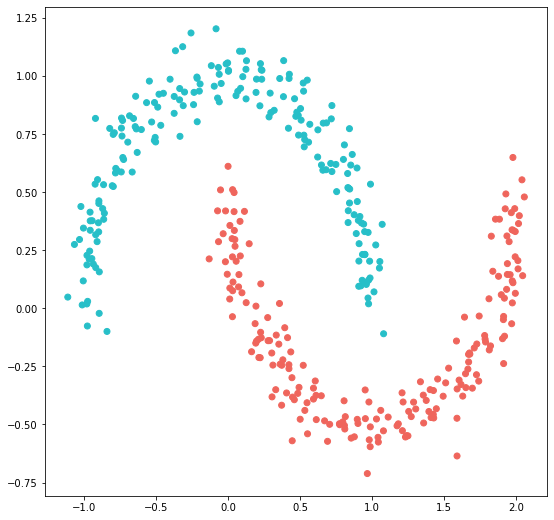

In [9]:
agg_clustering = AgglomertiveClustering(n_clusters=4, linkage = 'complete')
labels = agg_clustering.fit_predict(X_1)
visualize_clasters(X_1, labels)

agg_clustering = AgglomertiveClustering(n_clusters=2, linkage = 'single')
labels = agg_clustering.fit_predict(X_2)
visualize_clasters(X_2, labels)

### Задание 4 (1 балл)
Реализуйте методы считывания и записи изображения при помощи библиотеки OpenCV. 

#### Описание методов
`read_image(path)` читает изображение и возвращает его в виде трехмерного numpy массива размера `(N, M, C)`, где `N` и `M` - размеры изображения, а `C` - количество цветов (3 для обычного изображения)
`save_image(image, path)` сохраняет изображение.

__Учтите, что `cv2.imread` считывает изображение в цветовой схеме BGR. После считывания необходимо перевести его в RGB и нормализовать__

In [10]:
def read_image(path: str) -> np.array:
    image = cv2.imread(path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image/255
    """
    Читает изображение.

    Parameters
    ----------
    path : str
        Путь к изображению.
    
    Return
    ------
    image : np.array
        Трехмерный массив размера (N, M, C), 
        где N и M - размеры изображения, 
        а C - количество цветов (3 для обычного изображения).
    """

def show_image(image: np.array) -> NoReturn:
    """
    Выводит изображение

    Parameters
    ----------
    image : np.array
        Трехмерный массив - нормализованное изображение в цветовой схеме RGB.
    """
    plt.figure(figsize=np.array(image.shape[:-1]) / 50)
    plt.imshow(image)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

def save_image(image: np.array, path: str) -> NoReturn:
    """
    Сохраняет изображение.

    Parameters
    ----------
    image : np.array
        Трехмерный массив - нормализованное изображение в цветовой схеме RGB.
    path : str
        Путь для сохранения.
    """
    cv2.imwrite(path, image)

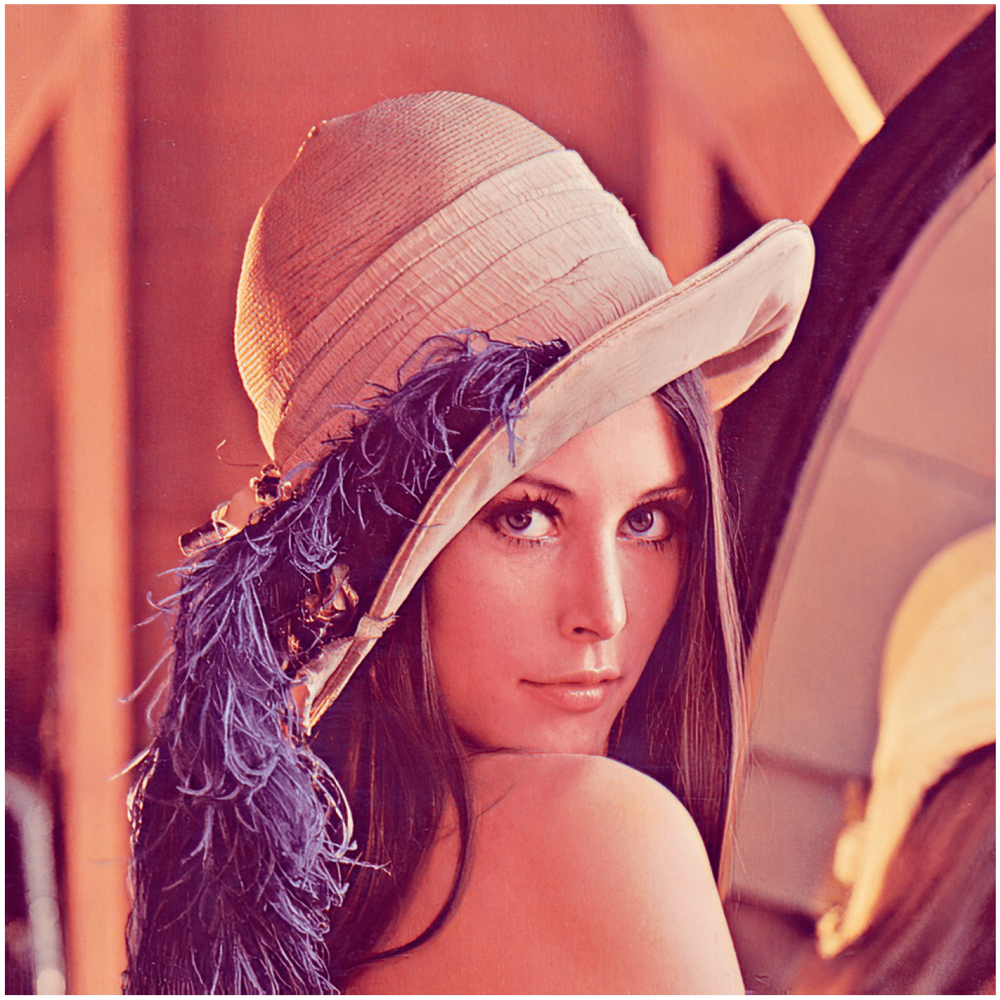

In [11]:
show_image(read_image("./Lena.png"))

### Задание 5 (1 балл)
Реализуйте функцию, которая будет кластеризовать цвета изображения одним из реализованных алгоритмов. Интерфейс этой функции можно менять. Функция должна возвращать новое изображение, в котором цвета заменены на цвета кластеров.

Затем примените ее к цветам изображения.

__Примечание: это задание проще всего выполнить при помощи KMeans__

In [12]:
def clusterize_image(image, **kwargs):
    image_compr = np.unique(np.reshape(image, (image.shape[0]*image.shape[1],image.shape[2])), axis=0)
    cluster_colors = np.random.random((50, 3)) # color of each cluster
    agg_clustering =  AgglomertiveClustering(n_clusters=50, linkage = 'complete')
    clusters = agg_clustering.fit_predict(image_compr) # Cluster labels for each pixel in flattened image
    recolored = image.copy()
    for i in np.unique(clusters):
        recolored[np.isin(recolored, image_compr[clusters == i]).any(axis=-1)] = cluster_colors[i]
    clusters_statistics(image_compr.reshape(-1, 3), cluster_colors, clusters) # Very slow (:
    return (recolored*255).astype(int)

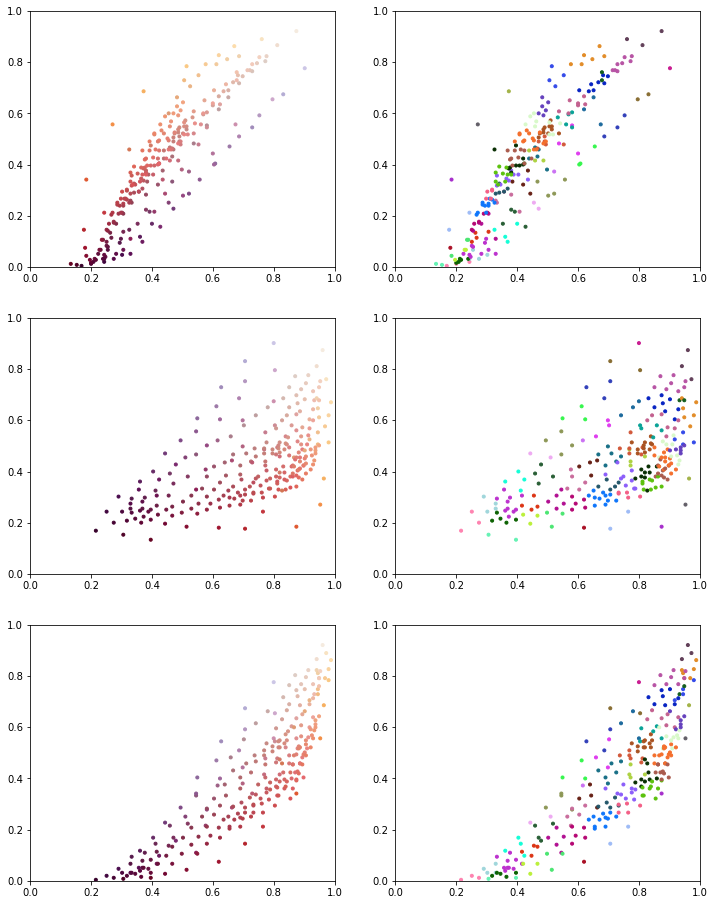

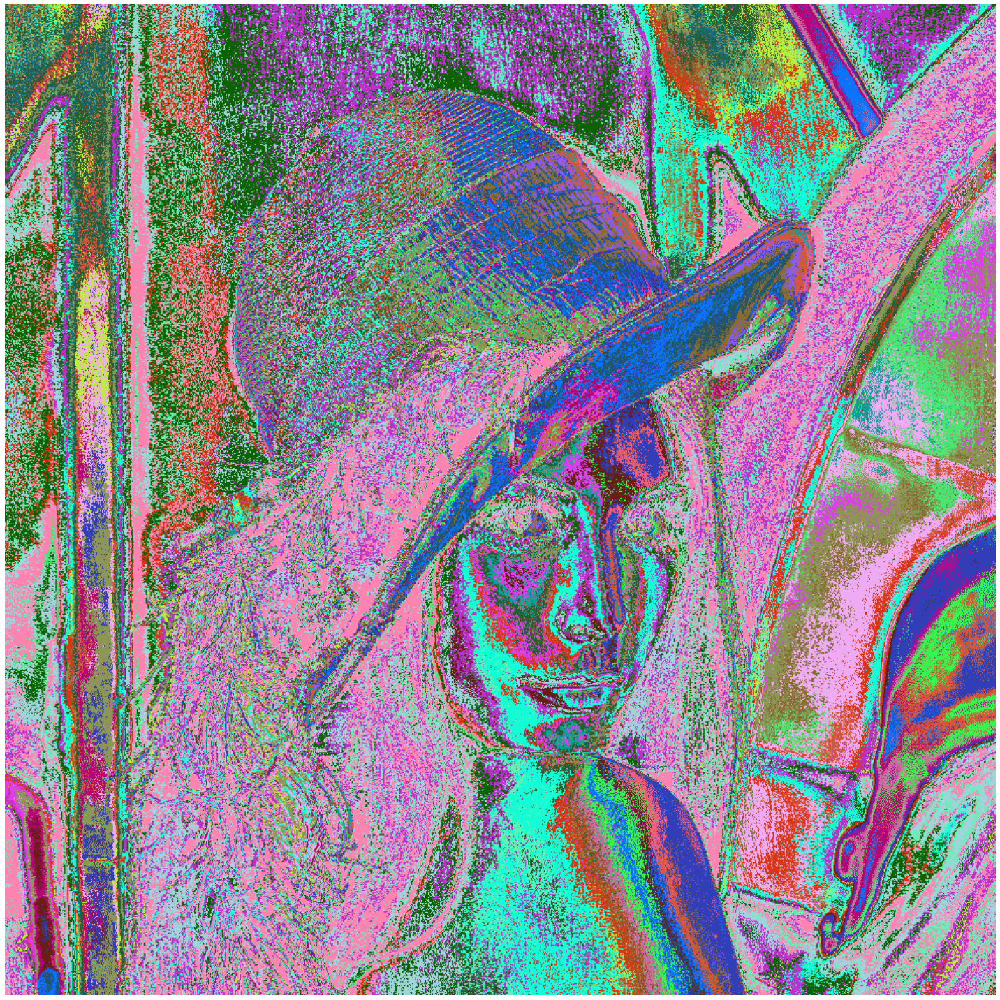

In [13]:
image = read_image("./Lena.png")
result = clusterize_image(image)
show_image(result)
save_image(result, "result.png")